[![Roboflow Notebooks](https://media.roboflow.com/notebooks/template/bannertest2-2.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672932710194)](https://github.com/roboflow/notebooks)

# Smart Parking Management with License Plate Detection, Tracking, and GLM-OCR

---

This notebook builds a smart parking management pipeline in three
incremental stages:

1. **Plate detection** - detect license plates on every frame with a
   fine-tuned model from [Roboflow Universe](https://universe.roboflow.com)
2. **Plate tracking** - assign persistent IDs to plates across frames
   with [OC-SORT](https://trackers.roboflow.com)
3. **Plate tracking + OCR** - read plate text with
   [GLM-OCR](https://huggingface.co/zai-org/GLM-OCR) when a new
   track is established

## Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi`
command to do that. In case of any problems navigate to `Edit` ->
`Notebook settings` -> `Hardware accelerator`, set it to `L4 GPU`,
and then click `Save`.

In [1]:
!nvidia-smi

Wed Mar 18 16:17:12 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA L4                      Off |   00000000:00:03.0 Off |                    0 |
| N/A   39C    P8             12W /   72W |       0MiB /  23034MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

### Configure your API keys

To run this notebook you need a HuggingFace Token (to download the
GLM-OCR model) and a Roboflow API Key (to run the plate detection
model).

- Open your [`HuggingFace Settings`](https://huggingface.co/settings) page. Click `Access Tokens` then `New Token` to generate new token.
- Go to your [`Roboflow Settings`](https://app.roboflow.com/settings/api) page. Click `Copy`. This will place your private key in the clipboard.
- In Colab, go to the left pane and click on `Secrets` (🔑).
    - Store HuggingFace Access Token under the name `HF_TOKEN`.
    - Store Roboflow API Key under the name `ROBOFLOW_API_KEY`.

In [2]:
import os
from google.colab import userdata

os.environ["HF_TOKEN"] = userdata.get("HF_TOKEN")
os.environ["ROBOFLOW_API_KEY"] = userdata.get("ROBOFLOW_API_KEY")

## Install dependencies

In [ ]:
!pip install -q inference-models trackers
!pip install -q git+https://github.com/huggingface/transformers.git

In [4]:
import os

import cv2
import numpy as np
import supervision as sv
import torch

from IPython.display import Video
from PIL import Image
from inference_models import AutoModel
from trackers import OCSORTTracker
from transformers import AutoProcessor, AutoModelForImageTextToText

## Download source video

We crop the left half of the original parking lot footage with
`ffmpeg` before running any detection.

In [ ]:
ORIGINAL_VIDEO_PATH = "/content/parking-1280x720.mp4"
SOURCE_VIDEO_PATH = "/content/parking-left-half.mp4"

!wget -q https://storage.googleapis.com/com-roboflow-marketing/supervision/video-examples/parking-1280x720.mp4 \
    -O {ORIGINAL_VIDEO_PATH}

!ffmpeg -y -loglevel error \
    -i {ORIGINAL_VIDEO_PATH} \
    -filter:v "crop=iw/2:ih:0:0" \
    {SOURCE_VIDEO_PATH}

In [6]:
video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
video_info

VideoInfo(width=640, height=720, fps=30, total_frames=1800)

## Configuration

In [7]:
PLATE_MODEL_ID = "licence-late-detection-vfeyk/1"
PLATE_DETECTION_CONFIDENCE = 0.3
MINIMUM_CONSECUTIVE_FRAMES = 10
MIN_PLATE_AREA_RATIO = 0.002
OCR_PLATE_AREA_RATIO = 0.005

OCR_PROMPT = "Read license plate number."

COLOR = sv.ColorPalette.from_hex([
    "#ffff00", "#ff9b00", "#ff66ff", "#3399ff", "#ff66b2", "#ff8080",
    "#b266ff", "#9999ff", "#66ffff", "#33ff99", "#66ff66", "#99ff00"
])

## Load plate detection model

In [ ]:
plate_detection_model = AutoModel.from_pretrained(
    PLATE_MODEL_ID, api_key=os.environ["ROBOFLOW_API_KEY"]
)

## Stage 1 - plate detection

Raw per-frame plate detection. Detections smaller than 0.2% of the
frame area are discarded.

### Single frame preview

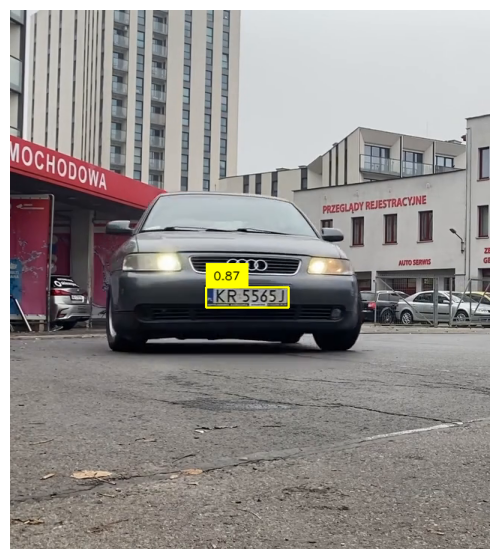

In [21]:
box_annotator = sv.BoxAnnotator(color=COLOR, thickness=2)
label_annotator = sv.LabelAnnotator(
    color=COLOR, text_color=sv.Color.BLACK, text_scale=0.5)

frame_generator = sv.get_video_frames_generator(
    SOURCE_VIDEO_PATH, start=200)
frame = next(frame_generator)
frame_height, frame_width = frame.shape[:2]
min_area = MIN_PLATE_AREA_RATIO * frame_width * frame_height

detections = plate_detection_model.infer(
    frame, confidence=PLATE_DETECTION_CONFIDENCE
)[0].to_supervision()
detections = detections[detections.area >= min_area]

labels = [f"{confidence:.2f}" for confidence in detections.confidence]

annotated_frame = frame.copy()
annotated_frame = box_annotator.annotate(annotated_frame, detections)
annotated_frame = label_annotator.annotate(
    annotated_frame, detections, labels)

sv.plot_image(annotated_frame, (12, 7))

### Full video

In [ ]:
DETECTION_VIDEO_PATH = "/content/parking-detection.mp4"
DETECTION_VIDEO_COMPRESSED_PATH = "/content/parking-detection-compressed.mp4"

box_annotator = sv.BoxAnnotator(color=COLOR, thickness=2)
label_annotator = sv.LabelAnnotator(
    color=COLOR, text_color=sv.Color.BLACK, text_scale=0.5)


def detection_callback(frame: np.ndarray, index: int) -> np.ndarray:
    frame_height, frame_width = frame.shape[:2]
    min_area = MIN_PLATE_AREA_RATIO * frame_width * frame_height

    detections = plate_detection_model.infer(
        frame, confidence=PLATE_DETECTION_CONFIDENCE
    )[0].to_supervision()
    detections = detections[detections.area >= min_area]

    labels = [f"{confidence:.2f}" for confidence in detections.confidence]

    annotated = frame.copy()
    annotated = box_annotator.annotate(annotated, detections)
    annotated = label_annotator.annotate(annotated, detections, labels)
    return annotated


sv.process_video(
    source_path=SOURCE_VIDEO_PATH,
    target_path=DETECTION_VIDEO_PATH,
    callback=detection_callback,
    show_progress=True,
)

In [11]:
!ffmpeg -y -loglevel error \
    -i {DETECTION_VIDEO_PATH} \
    -vcodec libx264 -crf 28 \
    {DETECTION_VIDEO_COMPRESSED_PATH}

In [12]:
Video(DETECTION_VIDEO_COMPRESSED_PATH, embed=True, width=1080)

## Stage 2 - plate tracking

OC-SORT assigns stable tracker IDs across frames. A track is only
emitted after 10 consecutive detections.

In [ ]:
TRACKING_VIDEO_PATH = "/content/parking-tracking.mp4"
TRACKING_VIDEO_COMPRESSED_PATH = "/content/parking-tracking-compressed.mp4"

tracker = OCSORTTracker(minimum_consecutive_frames=MINIMUM_CONSECUTIVE_FRAMES)

box_annotator = sv.BoxAnnotator(
    color=COLOR, color_lookup=sv.ColorLookup.TRACK, thickness=2)
label_annotator = sv.LabelAnnotator(
    color=COLOR, color_lookup=sv.ColorLookup.TRACK,
    text_color=sv.Color.BLACK, text_scale=0.5)
trace_annotator = sv.TraceAnnotator(
    color=COLOR, color_lookup=sv.ColorLookup.TRACK,
    thickness=2, trace_length=100)


def tracking_callback(frame: np.ndarray, index: int) -> np.ndarray:
    frame_height, frame_width = frame.shape[:2]
    min_area = MIN_PLATE_AREA_RATIO * frame_width * frame_height

    detections = plate_detection_model.infer(
        frame, confidence=PLATE_DETECTION_CONFIDENCE
    )[0].to_supervision()
    detections = detections[detections.area >= min_area]
    detections = tracker.update(detections)

    labels = [f"#{tracker_id}" for tracker_id in detections.tracker_id]

    annotated = frame.copy()
    annotated = trace_annotator.annotate(annotated, detections)
    annotated = box_annotator.annotate(annotated, detections)
    annotated = label_annotator.annotate(annotated, detections, labels)
    return annotated


tracker.reset()

sv.process_video(
    source_path=SOURCE_VIDEO_PATH,
    target_path=TRACKING_VIDEO_PATH,
    callback=tracking_callback,
    show_progress=True,
)

In [14]:
!ffmpeg -y -loglevel error \
    -i {TRACKING_VIDEO_PATH} \
    -vcodec libx264 -crf 28 \
    {TRACKING_VIDEO_COMPRESSED_PATH}

In [15]:
Video(TRACKING_VIDEO_COMPRESSED_PATH, embed=True, width=1080)

## Stage 3 - plate tracking with OCR

GLM-OCR reads the plate text once per track, the first time the
plate area reaches 0.5% of the frame.

In [ ]:
GLM_OCR_MODEL_ID = "zai-org/GLM-OCR"

ocr_processor = AutoProcessor.from_pretrained(GLM_OCR_MODEL_ID)
ocr_model = AutoModelForImageTextToText.from_pretrained(
    GLM_OCR_MODEL_ID,
    torch_dtype=torch.bfloat16,
    device_map="auto",
)

In [17]:
def run_ocr(image: Image.Image, prompt: str = OCR_PROMPT) -> str:
    """Run GLM-OCR on a single PIL image and return the decoded text."""
    messages = [
        {
            "role": "user",
            "content": [
                {"type": "image", "image": image},
                {"type": "text", "text": prompt},
            ],
        }
    ]
    inputs = ocr_processor.apply_chat_template(
        messages,
        tokenize=True,
        add_generation_prompt=True,
        return_dict=True,
        return_tensors="pt",
    ).to(ocr_model.device)
    inputs.pop("token_type_ids", None)
    generated_ids = ocr_model.generate(**inputs, max_new_tokens=50)
    return ocr_processor.decode(
        generated_ids[0][inputs["input_ids"].shape[1]:],
        skip_special_tokens=True,
    ).strip()

In [ ]:
OCR_VIDEO_PATH = "/content/parking-ocr.mp4"
OCR_VIDEO_COMPRESSED_PATH = "/content/parking-ocr-compressed.mp4"

tracker = OCSORTTracker(minimum_consecutive_frames=MINIMUM_CONSECUTIVE_FRAMES)
plate_registry: dict[int, str] = {}

box_annotator = sv.BoxAnnotator(
    color=COLOR, color_lookup=sv.ColorLookup.TRACK, thickness=2)
label_annotator = sv.LabelAnnotator(
    color=COLOR, color_lookup=sv.ColorLookup.TRACK,
    text_color=sv.Color.BLACK, text_scale=0.5)
trace_annotator = sv.TraceAnnotator(
    color=COLOR, color_lookup=sv.ColorLookup.TRACK,
    thickness=2, trace_length=100)


def ocr_callback(frame: np.ndarray, index: int) -> np.ndarray:
    frame_height, frame_width = frame.shape[:2]
    min_area = MIN_PLATE_AREA_RATIO * frame_width * frame_height
    ocr_min_area = OCR_PLATE_AREA_RATIO * frame_width * frame_height

    detections = plate_detection_model.infer(
        frame, confidence=PLATE_DETECTION_CONFIDENCE
    )[0].to_supervision()
    detections = detections[detections.area >= min_area]
    detections = tracker.update(detections)

    for detection_index in range(len(detections)):
        tracker_id = detections.tracker_id[detection_index]
        if tracker_id in plate_registry:
            continue
        if detections.area[detection_index] < ocr_min_area:
            continue

        xyxy = detections.xyxy[detection_index]
        padded = sv.pad_boxes(
            xyxy=xyxy.reshape(1, 4), px=10, py=10)
        padded = sv.clip_boxes(padded, (frame_width, frame_height))
        plate_crop = sv.crop_image(frame, padded[0])
        plate_pil = Image.fromarray(
            cv2.cvtColor(plate_crop, cv2.COLOR_BGR2RGB))

        text = run_ocr(plate_pil)
        if text:
            plate_registry[tracker_id] = text

    labels = [
        f"#{tracker_id} {plate_registry.get(tracker_id, '')}".strip()
        for tracker_id in detections.tracker_id
    ]

    annotated = frame.copy()
    annotated = trace_annotator.annotate(annotated, detections)
    annotated = box_annotator.annotate(annotated, detections)
    annotated = label_annotator.annotate(
        annotated, detections, labels)
    return annotated


tracker.reset()
plate_registry.clear()

sv.process_video(
    source_path=SOURCE_VIDEO_PATH,
    target_path=OCR_VIDEO_PATH,
    callback=ocr_callback,
    show_progress=True,
)

In [19]:
!ffmpeg -y -loglevel error \
    -i {OCR_VIDEO_PATH} \
    -vcodec libx264 -crf 28 \
    {OCR_VIDEO_COMPRESSED_PATH}

In [20]:
Video(OCR_VIDEO_COMPRESSED_PATH, embed=True, width=1080)

<div align="center">
  <p>
    Looking for more tutorials or have questions?
  </p>
  <a href="https://github.com/roboflow/notebooks/issues/new/choose">
    Open an Issue
  </a>
  <span> | </span>
  <a href="https://blog.roboflow.com">
    Roboflow Blog
  </a>
  <span> | </span>
  <a href="https://supervision.roboflow.com">
    Supervision Docs
  </a>
  <span> | </span>
  <a href="https://inference.roboflow.com">
    Inference Docs
  </a>
  <span> | </span>
  <a href="https://trackers.roboflow.com">
    Trackers Docs
  </a>
</div>